In [1]:
import shapely
import pandas as pd
import fiona
import geopandas as gpd
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as colrs
import matplotlib.pyplot as plt
from descartes.patch import PolygonPatch
from shapely.ops import unary_union
import os
import seaborn as sns
import pyproj
from pyproj import Proj, transform 

/home/andre/.local/lib/python3.8/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


# Defining a few functions that  we'll use across this notebook

In [2]:
"""
Main function for plotting choropleth maps over a static white background, using descartes' PolygonPatch

    comunes_geometry: shp geometries to be plotted 
    values: values that will correspond with the colors 
    center_value,max_value,min_value: used for colroscale normalization, since we're using a diverging colorscale we'll need a center value
    bound: this sets the boundaries of the map based on the geometries of the df 
    colorbar: if we want a colorbar to be plotted 
    circles: if we want to draw the circles over the selected set of cities
"""

def heatmap_plotter(comunes_geometry,values,center_value,max_value,min_value,bound,colorbar,circles):    
    my_cmap = cm.get_cmap("RdBu_r")
    norm = colrs.TwoSlopeNorm(vmin=min_value, vmax=max_value,vcenter=center_value)

    fig = plt.figure(figsize=(30, 30),dpi=100)
    
    ax = fig.add_axes([.0, 0, 1, 1])

    for value, shape in zip(values, comunes_geometry):

        color = colrs.to_hex(my_cmap(norm(value)))
        patch = PolygonPatch(shape, fc=color, ec=color)
        ax.add_patch(patch)

    ax.set_xlim(bound.minx.min()-0.1, bound.maxx.max()+0.1)
    ax.set_ylim(bound.miny.min()-0.1, bound.maxy.max()+0.1)

    plt.axis('off')
    
    if circles==True:
        for citie in cities_insee:
            if citie=='75056':
                circle_rad = 85
            else:
                circle_rad = 50
            cent = dif.loc[dif.insee==citie].geometry.values.centroid
            ax.plot(cent.x,cent.y,'o',ms=circle_rad * 2, mec='black', mfc='none', mew=5)
    
    if colorbar==True:
        sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=norm)
        sm.set_array([])
        cbar_ax = fig.add_axes([0.1, 0.25, 0.02, 0.3]) #left bar 
        cb = fig.colorbar(sm,orientation='vertical',pad=0.01,cax=cbar_ax)
        cb.set_ticks([-0.38,-0.2,0,0.18])
        cb.set_ticklabels(['-0.4','-0.2',' 0.0',' 0.2'])
        plt.text(-1.3,-0.4,'Standardized Traffic Density',rotation='vertical',fontsize=50)

    plt.show()

In [3]:
def heatmap_multiplotter(ax,comunes_geometry,values,center_value,max_value,min_value,title,bound):    
    my_cmap = cm.get_cmap("RdBu_r")
    norm = colrs.TwoSlopeNorm(vmin=min_value, vmax=max_value,vcenter=center_value)

    csfont = {'fontname':'DejaVu Sans'}
    
    for value, shape in zip(values, comunes_geometry):

        color = colrs.to_hex(my_cmap(norm(value)))
        patch = PolygonPatch(shape, fc=color, ec=color)
        ax.add_patch(patch)

    ax.set_xlim(bound.minx.min()-0.1, bound.maxx.max()+0.1)
    ax.set_ylim(bound.miny.min()-0.1, bound.maxy.max()+0.1)
    
    ax.set_axis_off()
    
    ax.set_title(title,fontsize=60)
    
    return norm

In [4]:
def differ(dept_2020,dept_2019):
    dif = dept_2020[['insee','norm_total_traffic_period']]
    temp = dept_2019[['insee','norm_total_traffic_period']]
    temp.columns = ['insee','norm_total_traffic_comp']
    dif = dif.merge(temp,how='inner',on='insee')
    dif['dif_traffic'] = (dif['norm_total_traffic_period'] - dif['norm_total_traffic_comp'])
    dif = comunes.merge(dif,how='inner',on='insee')
    dif = dif.to_crs({'init': 'epsg:4326 '})
    return dif 

# Comunes in France and timeline of mobility restrictions due to COVID

In [5]:
"""Shapefile of the comunes in France"""
comunes = gpd.read_file("../data/iris_new/region_dep_comune.shp")
comunes = comunes.to_crs({'init': 'epsg:27572 '}) #this crs is important since its made for the geography of France, and results in more precision when calculating the areas
comunes['area_km2'] = comunes.loc[:,'geometry'].area/(10**6)

/home/andre/.local/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [6]:
"""
There may be strange shapes over the boundaries of some comunes, from the df we got from INSEE's site. 
This will look for any comune duplicated, and drop the one with minimal area (which corresponds to the bugged shape)
"""
test = comunes.set_index('insee')
dups = test[test.index.duplicated()].reset_index()

dups_insee = dups.insee
list_dups = []
for i in dups_insee:
    list_dups.append(comunes.loc[comunes.insee==i].area_km2.idxmin())
    
comunes = comunes.drop(list_dups)

In [7]:
"""Fixing some other duplicated comunes insee that came from the original df"""
df_work_2A=comunes[comunes['insee'].str.startswith("2A",na=False)]
df_work_2B=comunes[comunes['insee'].str.startswith("2B",na=False)]

insee_2A_2B=list(set(df_work_2A['insee'])) + list( set(df_work_2B['insee']))

integer_insee=list(set(comunes['insee'])-set(insee_2A_2B))

comunes=comunes[comunes['insee'].isin(integer_insee)]
comunes=comunes.reset_index(drop=True)

comunes['insee']=comunes['insee'].astype(int)
comunes['insee']=comunes['insee'].astype(str)

new_comunes=gpd.GeoDataFrame({})

new_comunes=new_comunes.append(comunes)
new_comunes=new_comunes.append(df_work_2A)
new_comunes=new_comunes.append(df_work_2B)

new_comunes=new_comunes.reset_index(drop=True)

comunes=new_comunes
comunes = comunes.to_crs({'init': 'epsg:27572 '}) #giving it a CRS, in this case one specific for France 
comunes = comunes.to_crs({'init': 'epsg:4326 '}) #converting it to a lat-lon crs 

# Traffic data preprocessing

## Traffic files for the 2020-21 period

Those are the traffic files of our study, spanning from Oct/20 to May/21 and containing two lockdowns and three curfews. 

In [8]:
dept_traffic_l1 = pd.read_csv('../data/traffic_2020_2021/traffic_l1.csv')
dept_traffic_l5 = pd.read_csv('../data/traffic_2020_2021/traffic_l5.csv')
dept_traffic_l6 = pd.read_csv('../data/traffic_2020_2021/traffic_l6.csv')
dept_traffic_l8 = pd.read_csv('../data/traffic_2020_2021/traffic_l8.csv')
dept_traffic_l52 = pd.read_csv('../data/traffic_2020_2021/traffic_l52.csv')
dept_traffic_l82 = pd.read_csv('../data/traffic_2020_2021/traffic_l82.csv')

In [9]:
dept_traffic_mean = pd.read_csv('../data/traffic_2020_2021/norm_traffic_2020_21.csv')

In [10]:
#merging with comunes shapefile
comunes_2020 = comunes.merge(dept_traffic_mean,how='inner',on='insee')
comunes_2020 = comunes_2020.to_crs({'init': 'epsg:4326 '})

In [11]:
comunes_2020.head()

,rid,region_nam,depid,department,insee,comune_nam,geometry,area_km2,norm_km2_total_traffic,norm_total_traffic
0,44,Grand Est,51,Marne,51414,Olizy,"POLYGON ((3.74868 49.15852, 3.75026 49.15868, ...",4.557530,3.115820e+14,0.003936
1,32,Hauts-de-France,02,Aisne,2675,Sainte-Croix,"POLYGON ((3.77083 49.48565, 3.77203 49.48792, ...",3.360577,5.691414e+13,-0.061461
2,32,Hauts-de-France,02,Aisne,2809,Villers-Agron-Aiguizy,"POLYGON ((3.70649 49.18031, 3.71161 49.17948, ...",13.191870,4.387303e+13,-0.064810
3,44,Grand Est,51,Marne,51012,Anthenay,"POLYGON ((3.71701 49.14704, 3.71953 49.14881, ...",6.614586,3.852004e+14,0.022841
4,44,Grand Est,51,Marne,51298,Igny-Comblizy,"POLYGON ((3.66516 49.00563, 3.67497 49.01173, ...",40.966889,9.385778e+13,-0.051975


## Traffic files for the 2019 period

This will be our baseline, allowing comparisions with a "normal" period before COVID

In [12]:
dept_traffic_2019_median = pd.read_csv('../data/traffic_2019/norm_traffic_2019.csv')

In [13]:
"""Merging with the shapefiles so we have the geometries ready"""
comunes_2019 = comunes.merge(dept_traffic_2019_median,how='inner',on='insee')
comunes_2019 = comunes_2019.to_crs({'init': 'epsg:4326 '})

/home/andre/.local/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [14]:
comunes_2019.head()

,rid,region_nam,depid,department,insee,comune_nam,geometry,area_km2,norm_km2_total_traffic,norm_total_traffic
0,44,Grand Est,51,Marne,51414,Olizy,"POLYGON ((3.74868 49.15852, 3.75026 49.15868, ...",4.557530,5.225461e+12,-0.055130
1,32,Hauts-de-France,02,Aisne,2675,Sainte-Croix,"POLYGON ((3.77083 49.48565, 3.77203 49.48792, ...",3.360577,2.354364e+12,-0.067201
2,32,Hauts-de-France,02,Aisne,2809,Villers-Agron-Aiguizy,"POLYGON ((3.70649 49.18031, 3.71161 49.17948, ...",13.191870,3.778420e+12,-0.061214
3,44,Grand Est,51,Marne,51012,Anthenay,"POLYGON ((3.71701 49.14704, 3.71953 49.14881, ...",6.614586,3.481290e+12,-0.062463
4,44,Grand Est,51,Marne,51298,Igny-Comblizy,"POLYGON ((3.66516 49.00563, 3.67497 49.01173, ...",40.966889,4.297645e+12,-0.059031


# Mapping

## Dif between 2020-21 and 2019

In [15]:
"""Calculating a df that reflects the differences of traffic between the entire 2020-21 set and the 2019 set, per comune"""
dif = comunes_2020[['insee','norm_total_traffic']]
temp = comunes_2019[['insee','norm_total_traffic']]
temp.columns = ['insee','norm_total_traffic_comp']
dif = dif.merge(temp,how='inner',on='insee')
dif['dif_traffic'] = (dif['norm_total_traffic'] - dif['norm_total_traffic_comp'])
dif = comunes.merge(dif,how='inner',on='insee')
dif = dif.to_crs({'init': 'epsg:4326 '})

/home/andre/.local/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [16]:
"""Those lists of cities and their insee is used for titles on some of the maps"""

cities = ['Paris',
         'Marseille',
         'Lyon',
         'Toulouse',
         'Nice',
         'Nantes',
         'Montpellier',
         'Strasbourg',
         'Bordeaux',
         'Lille']

cities_insee = ['75056',
                '13055',
                '69123',
                '31555',
                '6088',
                '44109',
                '34172',
                '67482',
                '33063',
                '59350']

depts = []
for cit in cities_insee:
    depts.append(dif.loc[dif.insee==cit].depid.values[0])

/home/andre/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  exec(code_obj, self.user_global_ns, self.user_ns)
/home/andre/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  exec(code_obj, self.user_global_ns, self.user_ns)
/home/andre/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  exec(code_obj, self.user_global_ns, self.user_ns)
/home/andre/.local/lib/python3.

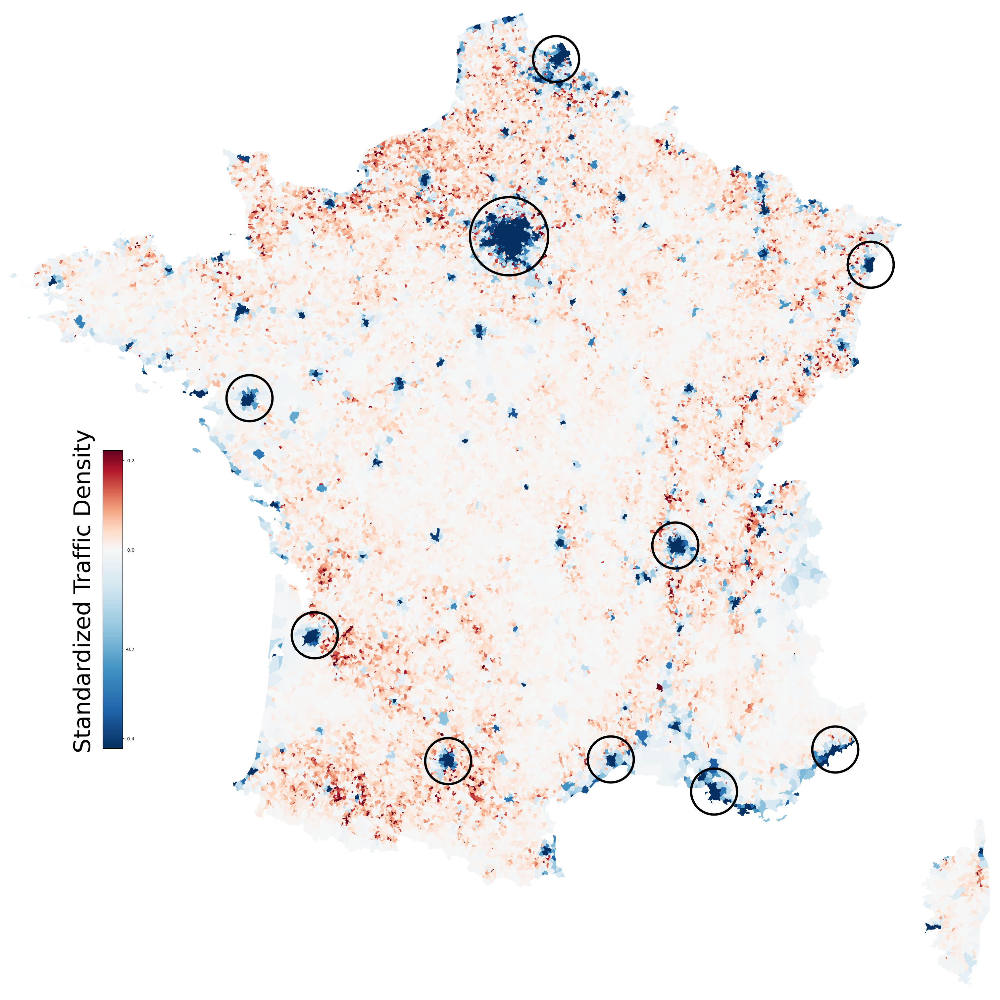

In [17]:
"""Plotting"""
heatmap_plotter(list(dif['geometry']),list(dif['dif_traffic']),0,0.2,-0.4,dif.geometry.bounds,True,True)

## Dif between 2020-21 and 2019 on selected departments

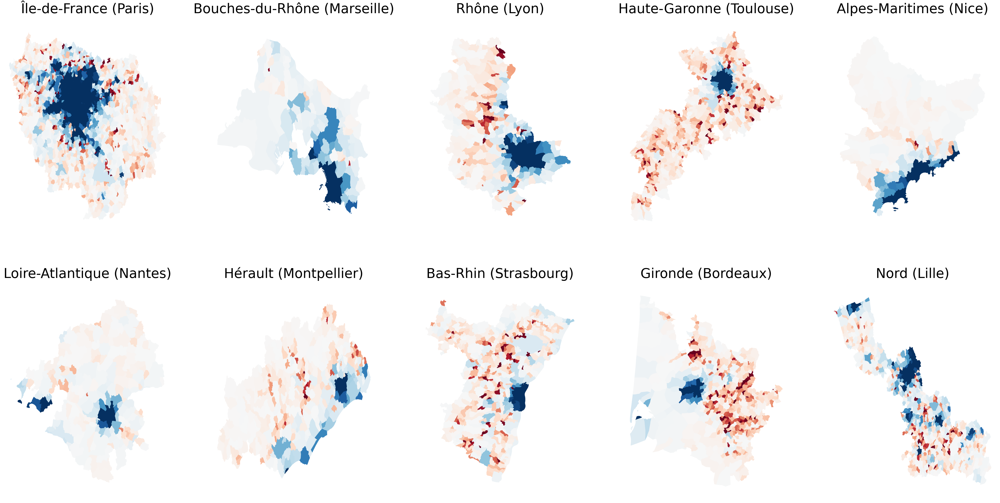

In [45]:
"""plotting the space around the top 10 most populated cities in France"""
nrows, ncols = 2, 5
fig = plt.figure(figsize=(80,40))    
xx = np.arange(1,11,1) 

for dept,x,city in zip(depts,xx,cities): 
    #since paris is it's own dept, this makes the plot of the ile de france region 
    if dept=='75':
        dif_depts = dif.loc[dif.rid=='11']
        title = dif_depts.region_nam.unique()[0] + ' (' + city + ')'
        ax = fig.add_subplot(nrows, ncols, x)
        heatmap_multiplotter(ax,list(dif_depts['geometry']),list(dif_depts['dif_traffic']),0,0.2,-0.5,title,dif_depts.geometry.bounds)
    #for the remainder top cities, just plotting their departments 
    else:
        dif_depts = dif.loc[dif.depid==dept]
        title = dif_depts.loc[dif_depts.depid==dept].department.unique()[0] + ' (' + city + ')'
        ax = fig.add_subplot(nrows, ncols, x)
        heatmap_multiplotter(ax,list(dif_depts['geometry']),list(dif_depts['dif_traffic']),0,0.2,-0.5,title,dif_depts.geometry.bounds)
    
plt.show()

## Dif between restriction periods inside the pandemic

In [46]:
dif_l6_l8 = differ(dept_traffic_l6,dept_traffic_l8)
dif_l82_l6 = differ(dept_traffic_l82,dept_traffic_l6)
dif_l52_l82 = differ(dept_traffic_l52,dept_traffic_l82)

/home/andre/.local/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


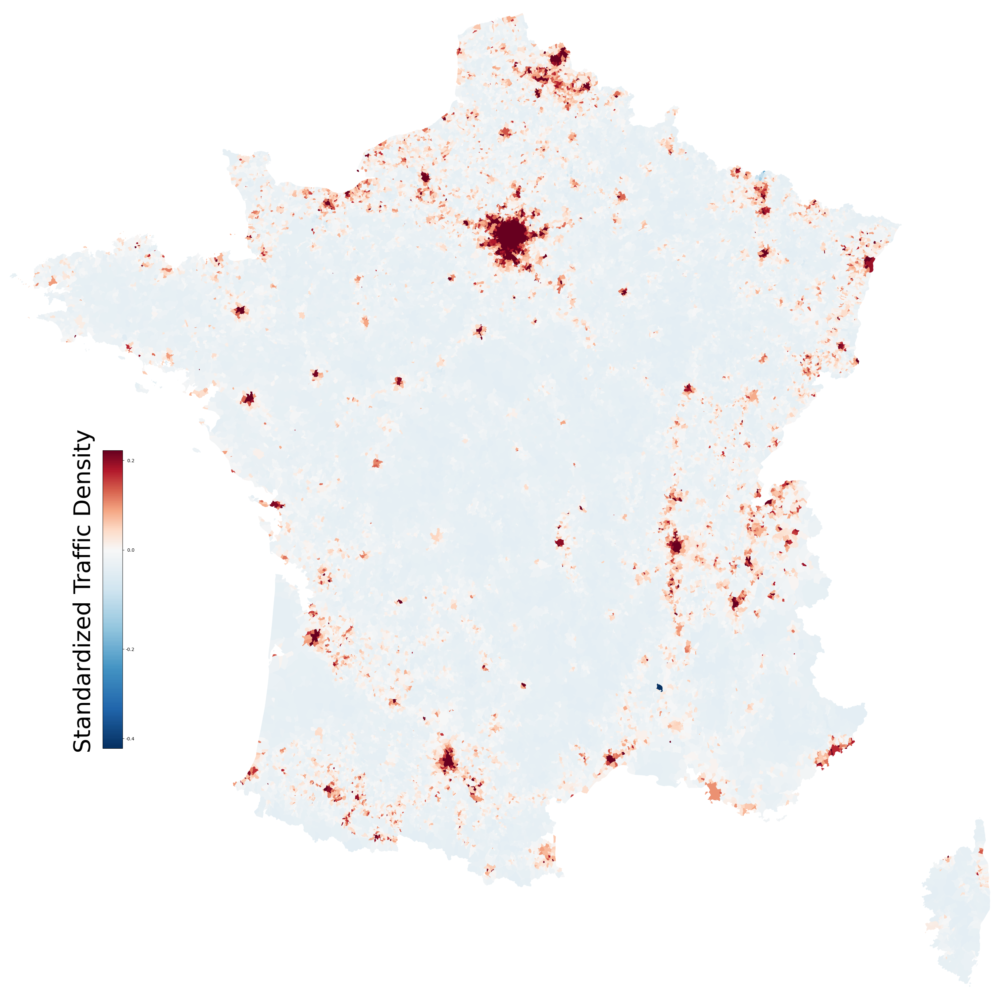

In [47]:
heatmap_plotter(list(dif_l6_l8['geometry']),list(dif_l6_l8['dif_traffic']),0,0.2,-0.4,dif_l6_l8.geometry.bounds,True,False)

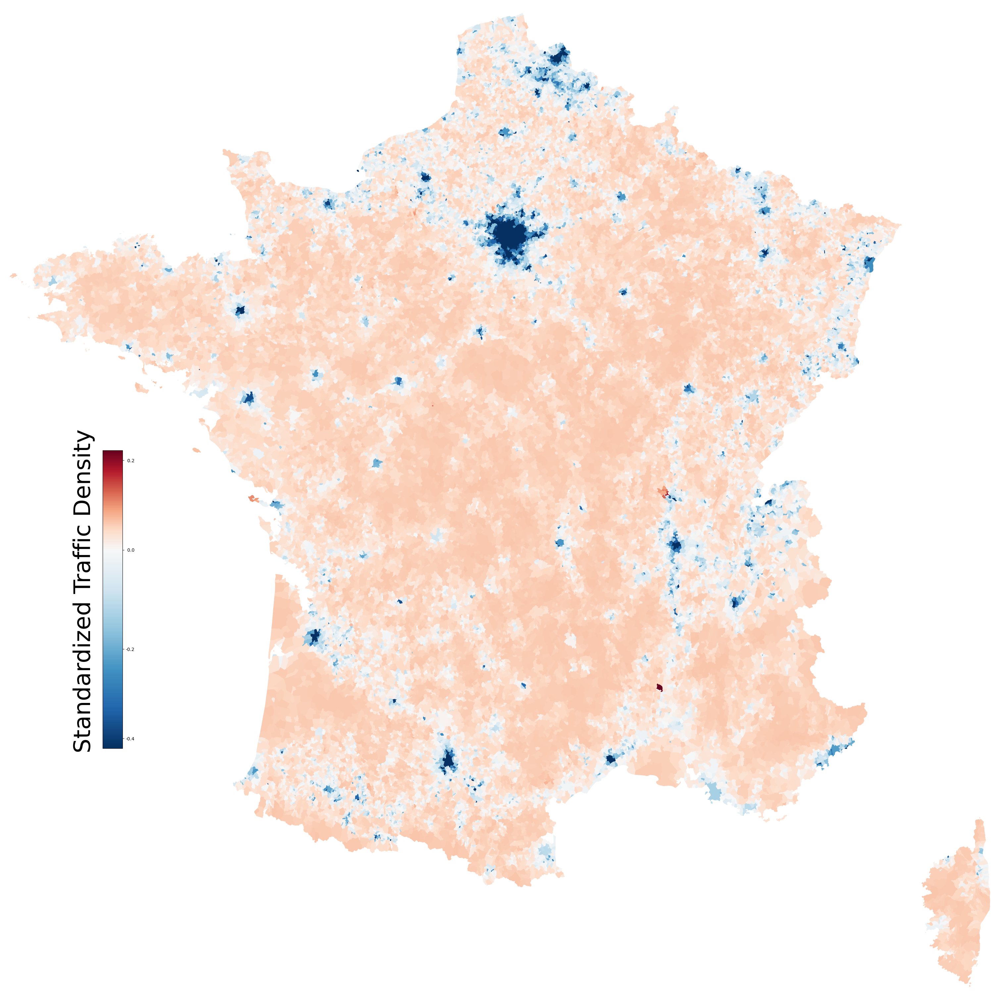

In [48]:
heatmap_plotter(list(dif_l82_l6['geometry']),list(dif_l82_l6['dif_traffic']),0,0.2,-0.4,dif_l82_l6.geometry.bounds,True,False)

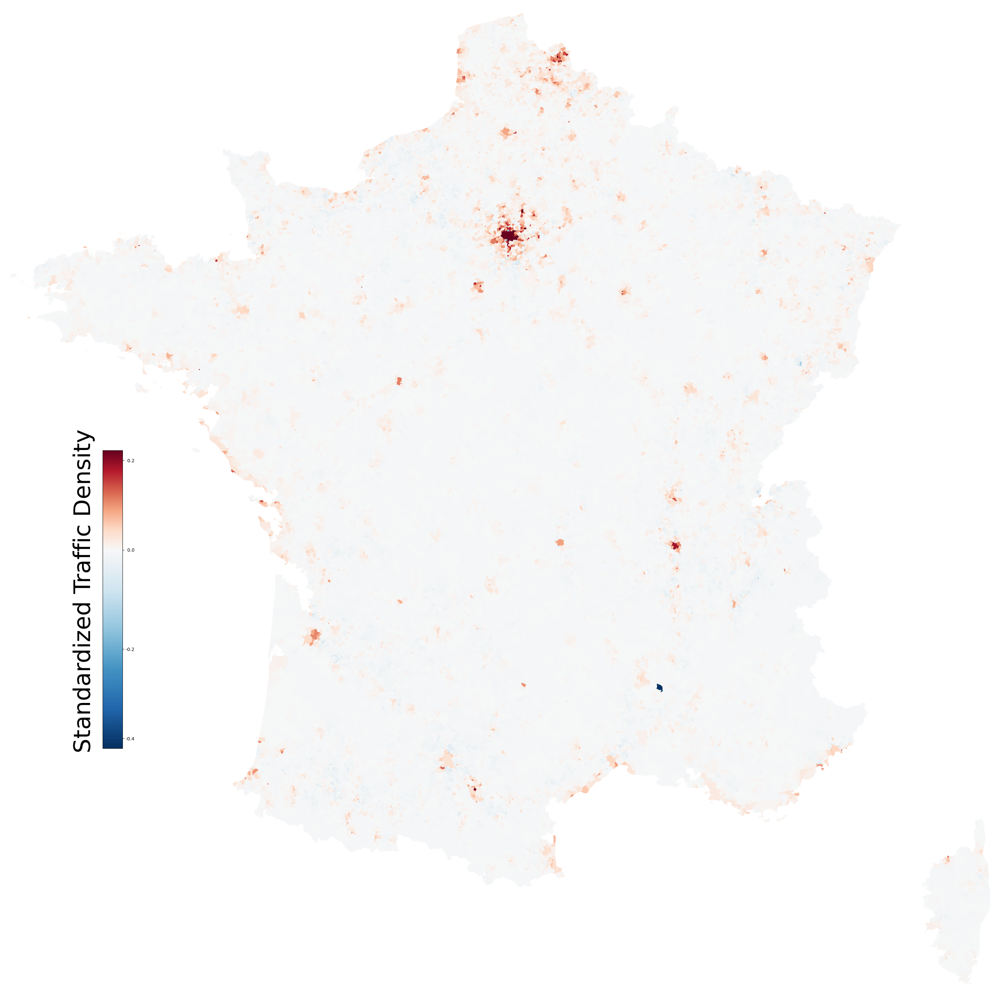

In [49]:
heatmap_plotter(list(dif_l52_l82['geometry']),list(dif_l52_l82['dif_traffic']),0,0.2,-0.4,dif_l52_l82.geometry.bounds,True,False)